TODO : 


1. Checkout the type of augmentation in Yolov4, EfficientDet-D0 and ssd-lite with MobileNetv3

2. Checkout for image augmentation:

https://imgaug.readthedocs.io/en/latest/source/overview/imgcorruptlike.html


https://imgaug.readthedocs.io/en/latest/source/jupyter_notebooks.html


3. Faire une video à faible luminosité et évaluer l'histogramme pour voir quelle limite à l'augmentation 

4. Voir lien faible luminosité et granulosité


5. check https://towardsdatascience.com/writing-a-custom-data-augmentation-layer-in-keras-2b53e048a98


In [1]:
#!/usr/bin/env python
# coding: utf-8

# https://github.com/CollabAR-Source/CollabAR-Code/blob/master/trainDisClassifer.py

'''
In real-world mobile AR scenarios, 
a large proportion of images taken by the smartphone or the head-mounted AR device contains distortions. 
For instance, images frequently contain motion blur caused by the motion of the user [1, 7]. 
Gaussian blur appears when the camera is de-focusing, or is used in an underwa- ter AR scenario [8]. 
Gaussian white noise is also inevitable in low illumination conditions [9]. 

Indeed, using two different commodity mobile AR devices, 
our measurement study (Section 3.3) indicates that over 70% of the images can be corrupted by distortions 
in different practical scenarios. 
Given the high distortion proportion, simply filtering out the distorted images, 
as has been suggested in prior work [1, 2, 10], can hardly solve the problem.
'''

from __future__ import print_function
import keras
from keras.datasets import cifar10
#from keras.applications.mobilenetv2 import MobileNetV2
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint
import random
import os
from keras.optimizers import SGD,Adam
import cv2
import numpy as np
import os
import sys
from keras.wrappers.scikit_learn import KerasClassifier
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Model
from sklearn.model_selection import train_test_split
from skimage.util import random_noise
from keras.layers import Reshape


In [2]:
def preprocess(image):
    return (image-image.min())/(image.max()-image.min())

def rgb2gray(rgb):
  image = np.dot(rgb[...,:3], [0.299, 0.587, 0.144])
  image = preprocess(image)
  return image

def get_Fourier(image):
    f = np.fft.fft2(image)
    fshif = np.fft.fftshift(f)
    s1 = np.log(20+np.abs(fshif))
    s1 = preprocess(s1)
    return s1


def motion_blur(image, degree):
    if degree != 0:
      angle = random.randint(1,360)
      M = cv2.getRotationMatrix2D((degree / 2, degree / 2), angle, 1)
      motion_blur_kernel = np.diag(np.ones(degree))
      motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, M, (degree, degree))

      motion_blur_kernel = motion_blur_kernel / degree
      blurred = cv2.filter2D(image, -1, motion_blur_kernel)
      cv2.normalize(blurred, blurred, 0, 255, cv2.NORM_MINMAX)
      blurred = np.array(blurred, dtype=np.uint8)
      if blurred.mean()>1:
        blurred = blurred/255
    else: 
      blurred = image
    return blurred

"Gaussian white noise is also inevitable in low illumination conditions"
def gaussion_noise(image,k):
    image = image/255
    k = k /1000
    image = random_noise(image, mode="gaussian", var = k)
    if image.mean()>1:
        image/255
    return image


"Gaussian blur appears when the camera is de-focusing, or is used in an underwater AR scenario "
def gaussion_blur(image, k):
    if k!=0:
      k = 2*k+1
      image = cv2.GaussianBlur(image,(k,k),0)

    if image.mean()>1:
      image = image/255
      return image

    

def change_brightness(rgb_image, multiplier):
    # inspired by https://www.programcreek.com/python/example/71307/cv2.COLOR_HSV2RGB
    '''
    Randomly changes the brightness of the input image.

    Protected against overflow.
    '''
    hsv = cv2.cvtColor(rgb_image,cv2.COLOR_RGB2HSV)
    mask = hsv[:,:,2] * multiplier > 255
    v_channel = np.where(mask, 255, hsv[:,:,2] * multiplier)
    hsv[:,:,2] = v_channel
    return cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)


def show_image(img) : 
    fig=plt.figure()
    plt.imshow(img)
    plt.show()


In [3]:
path = "COCO_train2014_000000003157.jpg"

original_img = cv2.imread(path)
#convert it to RGB
image = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
image = cv2.resize(image,(224,224))

deformed_images_type = ["motion_blur_5", "motion_blur_40", "gaussion_blur_3", "gaussion_blur_20", "gaussion_noise_5", "gaussion_noise_50"]
nb_distortions = len(deformed_images_type)
deformed_images = np.zeros((nb_distortions, 224,224,3))
deformed_images_Fourier = np.zeros((nb_distortions,224,224))


In [4]:
# Test deformations with extreme values from CollabAR

deformed_images[0, :, :, :] = motion_blur(image, 5)
deformed_images[1, :, :, :] = motion_blur(image, 40)

deformed_images[2, :, :, :] = gaussion_blur(image , 3)
deformed_images[3, :, :, :] = gaussion_blur(image , 20)

deformed_images[4, :, :, :] = gaussion_noise(image, 5)
deformed_images[5, :, :, :] = gaussion_noise(image, 40)

for i in range (len(deformed_images_type)) :
    deformed_images_Fourier[i, : , :] = get_Fourier(rgb2gray(deformed_images[i, : , :, :]))

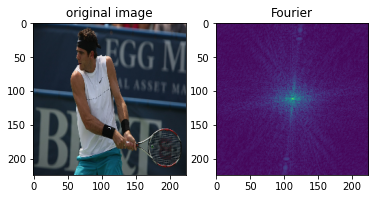

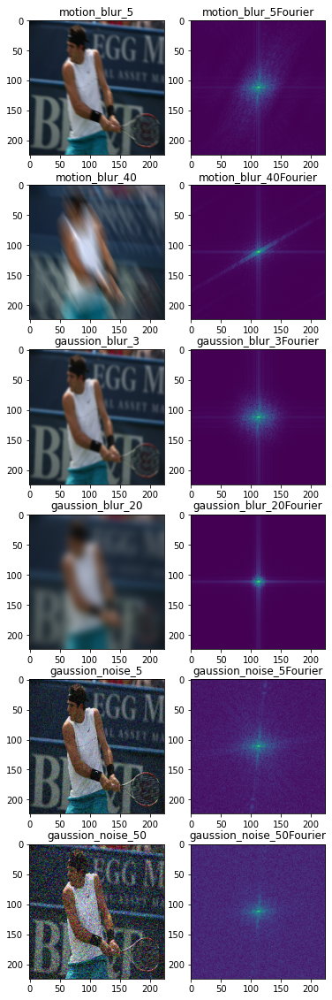

In [5]:
# show the original image
fig=plt.figure()

ax = fig.add_subplot(121)
ax.title.set_text("original image")
plt.imshow(image)

ax = fig.add_subplot(122)
plt.imshow(get_Fourier(rgb2gray(image)))
ax.title.set_text("Fourier")
    
plt.show


# Show transformations
fig=plt.figure(figsize=(6, 20))
columns = 2
rows = nb_distortions

for i in range(nb_distortions):
    ax = fig.add_subplot(rows, columns, i*2+1)
    ax.title.set_text(deformed_images_type[i])
    plt.imshow(deformed_images[i, :, :, :])
    
    ax = fig.add_subplot(rows, columns, i*2+2)
    plt.imshow(deformed_images_Fourier[i, :, :])
    ax.title.set_text(deformed_images_type[i] + "Fourier")

plt.show()
    
    

    



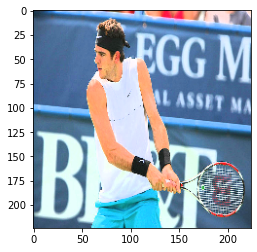

In [6]:
show_image(change_brightness(image, 3.0))

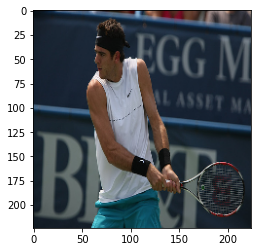

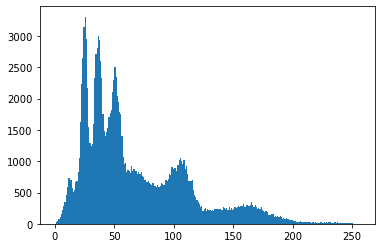

In [7]:
show_image(image)
plt.hist(image.ravel(),256,[0,256]); plt.show()

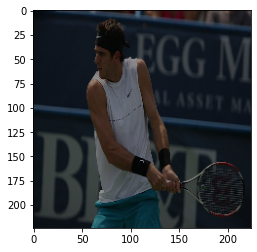

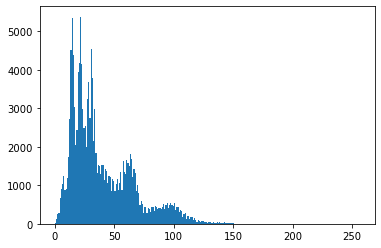

In [8]:
my_img = change_brightness(image, 0.6)
show_image(my_img)
plt.hist(my_img.ravel(),256,[0,256]); plt.show()

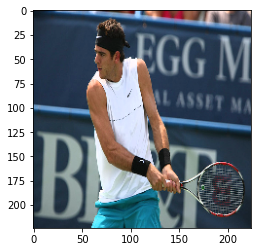

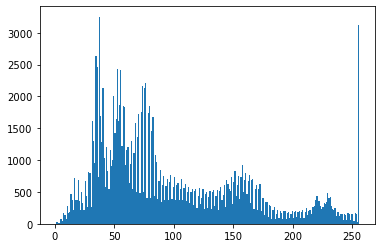

In [9]:
my_img = change_brightness(image, 1.5)
show_image(my_img)
plt.hist(my_img.ravel(),256,[0,256]); plt.show()

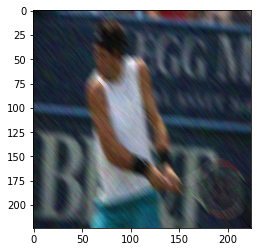

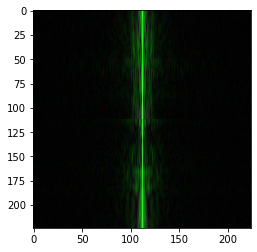

In [10]:
# Combining deformations
'''
gaussian_noise(motion_blur) doesnt work
'''

gaussian_noise_motion_blur = motion_blur(gaussion_noise(image, 10), 10)
show_image(gaussian_noise_motion_blur)
show_image(get_Fourier(gaussian_noise_motion_blur))



# With imgaug.augmenters

In [11]:
import imgaug.augmenters as iaa

gaussian_noise = iaa.imgcorruptlike.GaussianNoise(severity=2)
shot_noise = iaa.imgcorruptlike.ShotNoise(severity=2)
impulse_noise = iaa.imgcorruptlike.ImpulseNoise(severity=2)
speckle_noise = iaa.imgcorruptlike.SpeckleNoise(severity=2)
gaussian_blur = iaa.imgcorruptlike.GaussianBlur(severity=2)
glass_blur = iaa.imgcorruptlike.GlassBlur(severity=2)
motion_blur = iaa.imgcorruptlike.MotionBlur(severity=2)
zoom_blur = iaa.imgcorruptlike.ZoomBlur(severity=2)
fog = iaa.imgcorruptlike.Fog(severity=2)
frost = iaa.imgcorruptlike.Frost(severity=2)
snow = iaa.imgcorruptlike.Snow(severity=2)
spatter = iaa.imgcorruptlike.Spatter(severity=2)
contrast = iaa.imgcorruptlike.Contrast(severity=2)
brightness = iaa.imgcorruptlike.Brightness(severity=2)
saturate = iaa.imgcorruptlike.Saturate(severity=2)
jpeg_compression = iaa.imgcorruptlike.JpegCompression(severity=2)
pixelate = iaa.imgcorruptlike.Pixelate(severity=2)
elastic_transform = iaa.imgcorruptlike.ElasticTransform(severity=2)

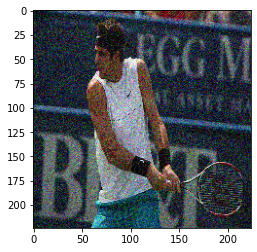

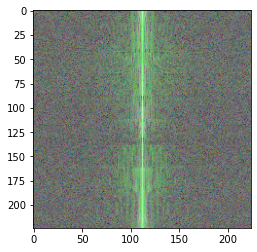

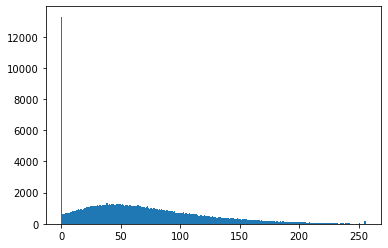

In [30]:
iaa_gaussian_noise = gaussian_noise(images = [image])[0]
show_image(iaa_gaussian_noise)
show_image(get_Fourier(iaa_gaussian_noise))
plt.hist(iaa_gaussian_noise.ravel(),256,[0,256]); plt.show()

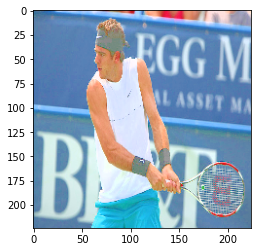

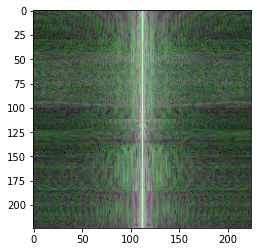

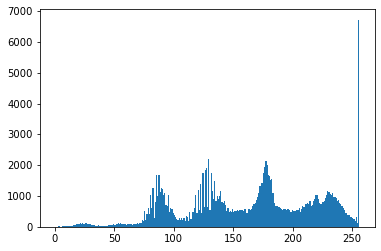

In [32]:
brightness = iaa.imgcorruptlike.Brightness(severity=5)
iaa_brightness = brightness(images = [image])[0]
show_image(iaa_brightness)
show_image(get_Fourier(iaa_brightness))
plt.hist(iaa_brightness.ravel(),256,[0,256]); plt.show()

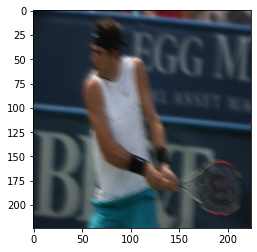

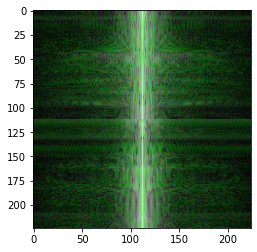

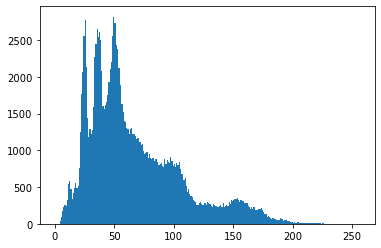

In [33]:
iaa_motion_blur = motion_blur(images = [image])[0]
show_image(iaa_motion_blur)
show_image(get_Fourier(iaa_motion_blur))
plt.hist(iaa_motion_blur.ravel(),256,[0,256]); plt.show()

# Video

<ipython-input-36-640df1d44509>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure()


error: OpenCV(4.4.0) /private/var/folders/nz/vv4_9tw56nv9k3tkvyszvwg80000gn/T/pip-req-build-gi6lxw0x/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


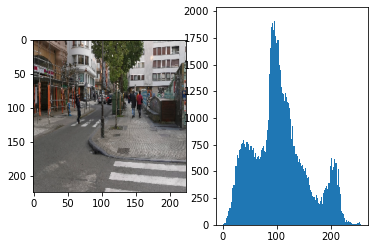

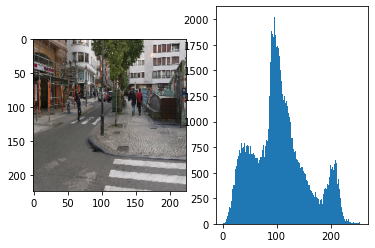

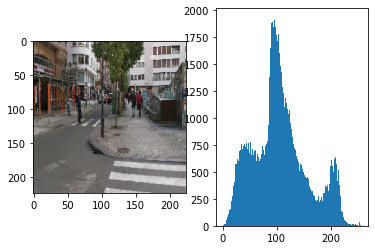

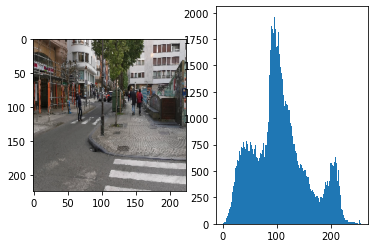

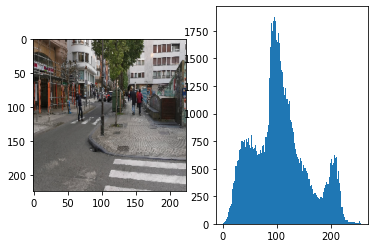

...

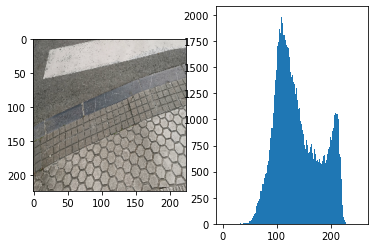

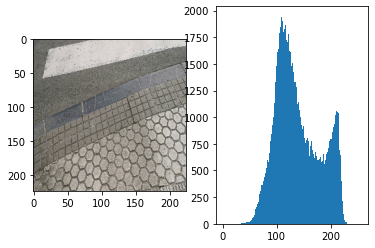

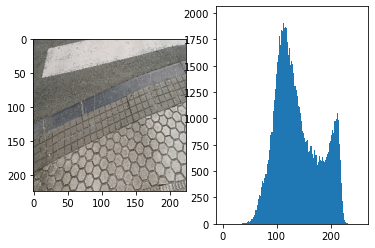

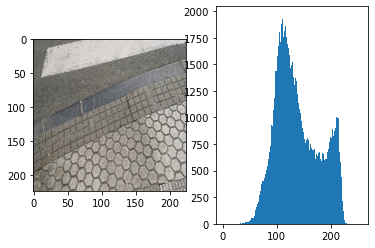

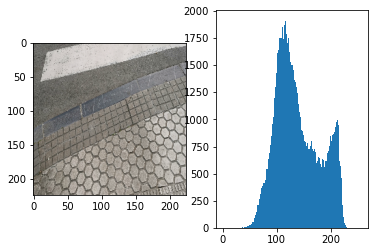

In [36]:
cap = cv2.VideoCapture('video.mp4')

while(cap.isOpened()):
    ret, new_frame = cap.read()
    frame = cv2.cvtColor(new_frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame,(224,224))
    
    fig=plt.figure()
    
    ax = fig.add_subplot(121)
    plt.imshow(frame)

    ax = fig.add_subplot(122)
    plt.hist(frame.ravel(),256,[0,256]); plt.show;
        

cap.release()
cv2.destroyAllWindows()

In [41]:
def load_image(path):
    original_img = cv2.imread(path)
    #convert it to RGB
    image = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image,(224,224))
    return image

def plot_with_histogram(img):
    fig=plt.figure()
    
    ax = fig.add_subplot(121)
    plt.imshow(img)

    ax = fig.add_subplot(122)
    plt.hist(img.ravel(),256,[0,256]); plt.show;


In [40]:
# img_ = load_image('')
img_museum = load_image('museum.jpg')
img_contre_jour_exterieur = load_image('contre_jour_exterieur.jpg')
img_library = load_image('library.jpg')
img_plage = load_image('plage.jpg')
img_rainy_day = load_image('rainy_day.jpg')
img_vitrine = load_image('vitrine.jpg')

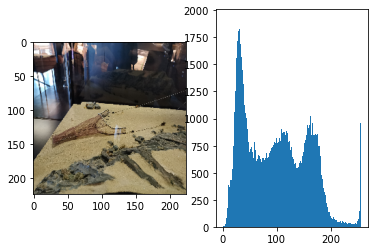

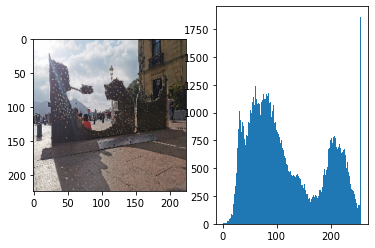

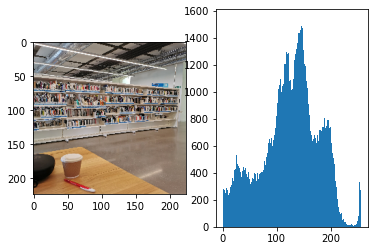

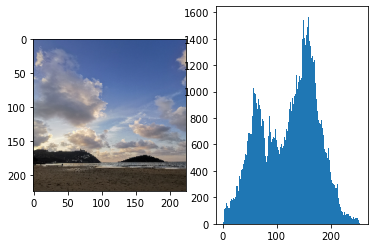

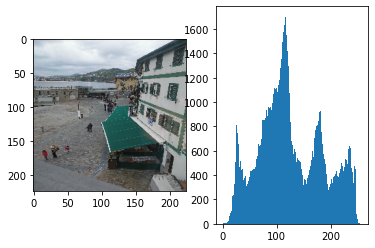

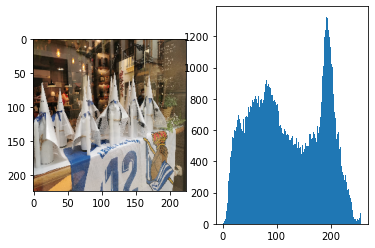

In [42]:
plot_with_histogram(img_museum)
plot_with_histogram(img_contre_jour_exterieur)
plot_with_histogram(img_library)
plot_with_histogram(img_plage)
plot_with_histogram(img_rainy_day)
plot_with_histogram(img_vitrine)